#Project Twitter Sentiment Analysis

**Name:** Emmanuel Nnadi

**Topic:** World Cup Tweets

**Objective:** The goal is to create an NLP that is able to analyze the tweets and get the general sentimnent. Then create a model that can predict sentiment.

In [0]:
# Spark Session creation.
from pyspark.sql import SparkSession
spark = SparkSession \
        .builder \
        .appName('WeCloud Spark Training') \
        .getOrCreate()
print('Session created')

Session created


In [0]:
# Spark Context creation.
sc = spark.sparkContext

## Data Mounting

In [0]:
def mount_s3_bucket(access_key, secret_key, bucket_name, mount_folder):
  ACCESS_KEY_ID = access_key
  SECRET_ACCESS_KEY = secret_key
  ENCODED_SECRET_KEY = SECRET_ACCESS_KEY.replace("/", "%2F")

  print ("Mounting", bucket_name)

  try:
    # Unmount the data in case it was already mounted.
    dbutils.fs.unmount("/mnt/%s" % mount_folder)
    
  except:
    # If it fails to unmount it most likely wasn't mounted in the first place
    print ("Directory not unmounted: ", mount_folder)
    
  finally:
    # Lastly, mount our bucket.
    dbutils.fs.mount("s3a://%s:%s@%s" % (ACCESS_KEY_ID, ENCODED_SECRET_KEY, bucket_name), "/mnt/%s" % mount_folder)
    #dbutils.fs.mount("s3a://"+ ACCESS_KEY_ID + ":" + ENCODED_SECRET_KEY + "@" + bucket_name, mount_folder)
    print ("The bucket", bucket_name, "was mounted to", mount_folder, "\n")

In [0]:
# Set AWS programmatic access credentials
ACCESS_KEY = xxx
SECRET_ACCESS_KEY = xxx

In [0]:
mount_s3_bucket(ACCESS_KEY, SECRET_ACCESS_KEY, "weclouddata/twitter/", "World_Cup")

Mounting weclouddata/twitter/
/mnt/World_Cup has been unmounted.
The bucket weclouddata/twitter/ was mounted to World_Cup 



### Check to see if the data is mounted

In [0]:
%fs ls /mnt/World_Cup/WorldCup/

path,name,size,modificationTime
dbfs:/mnt/World_Cup/WorldCup/2022/,2022/,0,1694076519621


In [0]:
%fs ls /mnt/World_Cup/WorldCup/2022/

path,name,size,modificationTime
dbfs:/mnt/World_Cup/WorldCup/2022/11/,11/,0,1694076520519
dbfs:/mnt/World_Cup/WorldCup/2022/12/,12/,0,1694076520519


**Problem 1:** 

Looks like we have multiple folders in the World Cup dataset. Therefore we need to ensure that we load all the folders in the data with one command. 

Each folder appears to have multiple sub folders. No need to load each folder one by one. Too time consuming.

**Problem 2:**

The data might not have headers so a schema needs to be created.

**Solution:**

Use '*' to load alll folders. 

Create Schema with data info.

### Schema Definition

Initial Data Exploration suggests that there are 9 columns.

I named what I could but I left the others unkown for now.

In [0]:
from pyspark.sql.types import *

wcSchema = StructType([
  StructField("Tweet_ID", StringType(), True),
  StructField("Display Name", StringType(), True),
  StructField("Handle", StringType(), True),
  StructField("Tweet", StringType(), True),
  StructField("Followers", IntegerType(), True),
  StructField("Location", StringType(), True), # Display on location needs cleaning. 
  StructField("Unknown_Column1", StringType(), True), # Later discovered to be coordinates. Most are "None" or null. 
  StructField("Post_Date", StringType(), True), 
  StructField("Unknown_Column2", StringType(), True) # Later to be discovered to be date and time, but most of it is null.
])


#### Read files in

In [0]:
# World cup has 22 million tweets. This times out the cluster in the free version. Had to reduce it to just the month of November. Did a sub sample. This has 8 million tweets.
wcpath = "/mnt/World_Cup/WorldCup/2022/11/*/*/"

wc = (spark.read                 
   .option("header", "true")       # Use first line of all files as header
   .option("delimiter", "\t")      # Use tab delimiter (default is comma-separator)
   .schema(wcSchema) 
   .csv(wcpath)                  # Creates a DataFrame from CSV after reading in the file
)

In [0]:
# Will be referencing this code a lot so it is best to cache it. 

wc.cache()

Out[8]: DataFrame[Tweet_ID: string, Display Name: string, Handle: string, Tweet: string, Followers: int, Location: string, Unknown_Column1: string, Post_Date: string, Unknown_Column2: string]

In [0]:
wc.show()

+-------------------+--------------------+---------------+----------------------+---------+--------------------+---------------+--------------------+---------------+
|           Tweet_ID|        Display Name|         Handle|                 Tweet|Followers|            Location|Unknown_Column1|           Post_Date|Unknown_Column2|
+-------------------+--------------------+---------------+----------------------+---------+--------------------+---------------+--------------------+---------------+
|1595031087268663300|    Amazon Affiliate|   abbashah2222|  @ahmed929_dr @koo...|        4|            Pakistan|           None|Tue Nov 22 12:27:...|           null|
|1595031087385923584|        أبو نــــورة|     MAFRNA1986|  RT @nytimes: Brea...|      238|                None|           None|Tue Nov 22 12:27:...|           null|
|1595031087276859400|Marialicia🔥UNDER...|marialicia29dic|  RT @btschartdata:...|      148|          Lima, Peru|           None|Tue Nov 22 12:27:...|           null|
|1595

In [0]:
wc.count()

Out[10]: 8508525

## Basic Data Exploration

In [0]:
wc_1 = wc.limit(5)

In [0]:
# display for a more refined display.
display(wc_1)

Tweet_ID,Display Name,Handle,Tweet,Followers,Location,Unknown_Column1,Post_Date,Unknown_Column2
1595031087268663300,Amazon Affiliate,abbashah2222,@ahmed929_dr @kooora Adidas FIFA World Cup Qatar 2022 Al Rihla Soccer Ball Price: $24.99 https://t.co/HJ6VWQE0VP,4,Pakistan,None,Tue Nov 22 12:27:00 +0000 2022,null
1595031087385923584,أبو نــــورة,MAFRNA1986,"RT @nytimes: Breaking News: In one of the biggest upsets in World Cup history, Saudi Arabia stunned Lionel Messi and Argentina to win, 2-1,…",238,None,None,Tue Nov 22 12:27:00 +0000 2022,null
1595031087276859400,Marialicia🔥UNDER THE SKIN🔥,marialicia29dic,"RT @btschartdata: The music video for “Dreamers” is here, watch and let us know your favorite parts! 📼⚽️",148,"Lima, Peru",None,Tue Nov 22 12:27:00 +0000 2022,null
1595031087381680130,SHADRACH YEBOAH❤️🤲🏽,PaapaYe74437105,@SaddickAdams Point of correction boss… Ghana is the weakest team in the World Cup 😁,9,None,None,Tue Nov 22 12:27:00 +0000 2022,null
1595031087419367424,Shank is on annual leave.,Shankballs,Convert to Islam brother 🙏🏾🙏🏾🙏🏾,841,Nowhere,None,Tue Nov 22 12:27:00 +0000 2022,null


In [0]:
# This shows the null values in the data set. As we can see "Unknown column2" is useless. Pretty much the whole column 2 is Null. I am also looking to drop rows that have missing tweets.
# Missing tweets will not help with sentiment analysis.
# I just want to see the amount of null rows of tweets in the dataset.

from pyspark.sql.functions import col, sum
null_counts = wc.select([(sum(col(c).isNull().cast("int"))).alias(c) for c in wc.columns])

null_counts.show()

+--------+------------+------+-----+---------+--------+---------------+---------+---------------+
|Tweet_ID|Display Name|Handle|Tweet|Followers|Location|Unknown_Column1|Post_Date|Unknown_Column2|
+--------+------------+------+-----+---------+--------+---------------+---------+---------------+
|    2657|        9731|  8672|16619|    18525|   19238|          26651|    26565|        8508370|
+--------+------------+------+-----+---------+--------+---------------+---------+---------------+



##### Thought Process: 

As you can see the Unkown Column 2 does not add much value. Over 90% of this column is null. Let us first see what it was supposed to represent.

The code below checks to see if there are valuable things in Unknown column 1 and 2. We need to check to see what those columns were supposed to represent.

In [0]:
# There are 426 unique contents in this column
unique_count = wc.select("Unknown_Column1").distinct().count()
display(unique_count)


426

The following code below checks to see the distribution of these items.

In [0]:
from pyspark.sql.functions import desc

value_counts = wc.groupBy("Unknown_Column1").count().orderBy(desc("count"))
value_counts.show(n=50, truncate=False)

# A good chunk is classified as "None", even though they are supposed to represent coordinates. I decided to drop this column as 99% missing data seems irrelevant. 
# Only just a handful of coordinates aren't worth it in my opinion. 

+--------------------------------------------------------------+-------+
|Unknown_Column1                                               |count  |
+--------------------------------------------------------------+-------+
|None                                                          |8481038|
|null                                                          |26651  |
|{'type': 'Point', 'coordinates': [23.8621585, 90.27603]}      |144    |
|{'type': 'Point', 'coordinates': [25.28495028, 51.52631189]}  |56     |
|{'type': 'Point', 'coordinates': [25.28570463, 51.5273273]}   |23     |
|{'type': 'Point', 'coordinates': [25.28716719, 51.56679512]}  |12     |
|{'type': 'Point', 'coordinates': [-1.292066, 36.821945]}      |12     |
|{'type': 'Point', 'coordinates': [25.42058453, 51.49063777]}  |11     |
|{'type': 'Point', 'coordinates': [3.07353803, 101.51649356]}  |9      |
|{'type': 'Point', 'coordinates': [25.269535, 51.212767]}      |8      |
|{'type': 'Point', 'coordinates': [25.27698, 51.531

In [0]:
# This suggests that this column was supposed to be Day, Month, Year, Timestamp and Year. The issue is that most of it is missing and classified as null.

val_count = wc.groupBy("Unknown_Column2").count().orderBy(desc("count"))
val_count.show(n=50, truncate=False)

+------------------------------+-------+
|Unknown_Column2               |count  |
+------------------------------+-------+
|null                          |8508370|
|None                          |22     |
|Tue Nov 29 00:42:22 +0000 2022|2      |
|Wed Nov 23 17:05:21 +0000 2022|1      |
|Tue Nov 22 10:56:12 +0000 2022|1      |
|Tue Nov 22 10:52:36 +0000 2022|1      |
|Tue Nov 22 10:52:51 +0000 2022|1      |
|Tue Nov 22 10:55:55 +0000 2022|1      |
|Tue Nov 22 10:53:38 +0000 2022|1      |
|Tue Nov 22 11:22:19 +0000 2022|1      |
|Tue Nov 22 10:55:40 +0000 2022|1      |
|Tue Nov 22 10:57:24 +0000 2022|1      |
|Tue Nov 22 11:03:17 +0000 2022|1      |
|Tue Nov 22 11:22:35 +0000 2022|1      |
|Tue Nov 22 11:19:20 +0000 2022|1      |
|Tue Nov 22 16:38:01 +0000 2022|1      |
|Tue Nov 22 16:52:58 +0000 2022|1      |
|Tue Nov 22 16:38:39 +0000 2022|1      |
|Tue Nov 22 20:37:58 +0000 2022|1      |
|Tue Nov 22 15:35:10 +0000 2022|1      |
|Sat Nov 26 21:48:12 +0000 2022|1      |
|Tue Nov 22 20:4

**Now let us deal with the missing tweets**

In [0]:
# from pyspark.sql.functions import col

# # Filter rows where 'Tweet' is null
null_tweets = wc.filter(col("Tweet").isNull())

# # Display the rows
display(null_tweets.limit(10))



Tweet_ID,Display Name,Handle,Tweet,Followers,Location,Unknown_Column1,Post_Date,Unknown_Column2
estrelas e do infinito lá no alto.,null,null,null,null,null,null,null,null
Então a vida parece quase encantada,null,null,null,null,null,null,null,null
depois de tudo.,None,Tue Nov 22 12:27:09 +0000 2022,null,null,null,null,null,null
estrelas e do infinito lá no alto.,null,null,null,null,null,null,null,null
Então a vida parece quase encantada,null,null,null,null,null,null,null,null
depois de tudo.,None,Tue Nov 22 12:27:13 +0000 2022,null,null,null,null,null,null
ᝰ slow collector 🥽,null,null,null,null,null,null,null,null
"for eternal love, 방탄 ֶָ֢⁠𖧧࣪˒",None,Tue Nov 22 12:27:17 +0000 2022,null,null,null,null,null,null
selective fbs,null,null,null,null,null,null,null,null
sb to unf !,null,null,null,null,null,null,null,null


In [0]:
null_tweets.count()

Out[18]: 16619

In [0]:
null_tweets.select("Tweet").count()/wc.select("Tweet").count()

Out[19]: 0.0019532175083225353

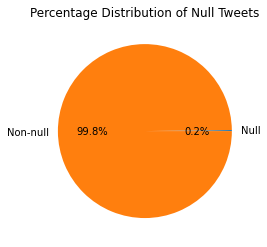

In [0]:
import matplotlib.pyplot as plt

# Calculate the values
null_count = null_tweets.select("Tweet").count()
total_count = wc.select("Tweet").count()
non_null_count = total_count - null_count

# List creation
values = [null_count, non_null_count]

labels = ["Null", "Non-null"]

plt.pie(values, labels=labels, autopct='%1.1f%%')
plt.title("Percentage Distribution of Null Tweets")

plt.show()


This is a good sign, this shows that a good portion of the dataset is actually viable for sentiment analysis. We can drop the 0.2%.

In [0]:
from pyspark.sql.functions import col
# We need to just see where the tweets are not null. I decided to use '~' for negation to give the inverse. This in a way drops the null tweets.

wc = wc.filter(~col("Tweet").isNull())

display(wc.limit(5))

Tweet_ID,Display Name,Handle,Tweet,Followers,Location,Unknown_Column1,Post_Date,Unknown_Column2
1595031087268663300,Amazon Affiliate,abbashah2222,@ahmed929_dr @kooora Adidas FIFA World Cup Qatar 2022 Al Rihla Soccer Ball Price: $24.99 https://t.co/HJ6VWQE0VP,4,Pakistan,None,Tue Nov 22 12:27:00 +0000 2022,null
1595031087385923584,أبو نــــورة,MAFRNA1986,"RT @nytimes: Breaking News: In one of the biggest upsets in World Cup history, Saudi Arabia stunned Lionel Messi and Argentina to win, 2-1,…",238,None,None,Tue Nov 22 12:27:00 +0000 2022,null
1595031087276859400,Marialicia🔥UNDER THE SKIN🔥,marialicia29dic,"RT @btschartdata: The music video for “Dreamers” is here, watch and let us know your favorite parts! 📼⚽️",148,"Lima, Peru",None,Tue Nov 22 12:27:00 +0000 2022,null
1595031087381680130,SHADRACH YEBOAH❤️🤲🏽,PaapaYe74437105,@SaddickAdams Point of correction boss… Ghana is the weakest team in the World Cup 😁,9,None,None,Tue Nov 22 12:27:00 +0000 2022,null
1595031087419367424,Shank is on annual leave.,Shankballs,Convert to Islam brother 🙏🏾🙏🏾🙏🏾,841,Nowhere,None,Tue Nov 22 12:27:00 +0000 2022,null


In [0]:
# If you look at the previous count in the notebook it was 8508525. 
previous_count = 8508525
val_chk = wc.count()
print(val_chk)

difference = previous_count - val_chk
print(f"The Difference is {difference}")

8491906
The Difference is 16619


In [0]:
# Now we see that there are no null tweets now.
from pyspark.sql.functions import col, sum
null_counts = wc.select([(sum(col(c).isNull().cast("int"))).alias(c) for c in wc.columns])

display(null_counts.limit(5))

Tweet_ID,Display Name,Handle,Tweet,Followers,Location,Unknown_Column1,Post_Date,Unknown_Column2
0,1088,0,0,1906,2619,10032,9946,8491751


In [0]:
# Due to the reasons above, with exploration I decided it would be best to drop the following columns. No value in analysis or visulaization.
# Tweet ID is just an ID identifier for each tweet so it is noise in this analysis. 

wc = wc.drop("Tweet_ID","Unknown_Column1", "Unknown_Column2")

display(wc.limit(5))

Display Name,Handle,Tweet,Followers,Location,Post_Date
Amazon Affiliate,abbashah2222,@ahmed929_dr @kooora Adidas FIFA World Cup Qatar 2022 Al Rihla Soccer Ball Price: $24.99 https://t.co/HJ6VWQE0VP,4,Pakistan,Tue Nov 22 12:27:00 +0000 2022
أبو نــــورة,MAFRNA1986,"RT @nytimes: Breaking News: In one of the biggest upsets in World Cup history, Saudi Arabia stunned Lionel Messi and Argentina to win, 2-1,…",238,None,Tue Nov 22 12:27:00 +0000 2022
Marialicia🔥UNDER THE SKIN🔥,marialicia29dic,"RT @btschartdata: The music video for “Dreamers” is here, watch and let us know your favorite parts! 📼⚽️",148,"Lima, Peru",Tue Nov 22 12:27:00 +0000 2022
SHADRACH YEBOAH❤️🤲🏽,PaapaYe74437105,@SaddickAdams Point of correction boss… Ghana is the weakest team in the World Cup 😁,9,None,Tue Nov 22 12:27:00 +0000 2022
Shank is on annual leave.,Shankballs,Convert to Islam brother 🙏🏾🙏🏾🙏🏾,841,Nowhere,Tue Nov 22 12:27:00 +0000 2022


In [0]:
# # Lagos Nigeria has the most tweets.

# from pyspark.sql.functions import count
# wc_loc = wc.groupBy("location").agg(count("location").alias("country_cnt"))

# # Display the results
# wc_loc = wc_loc.orderBy("country_cnt", ascending=False)

# wc_loc.show()

In [0]:
# Time Cleaning Code.
from pyspark.sql.functions import concat, lit, split

wc = wc.withColumn(
    "date",
    concat(
        split(wc["Post_Date"], " ")[5],  # Year
        lit("-"),
        split(wc["Post_Date"], " ")[1],  # Month
        lit("-"),
        split(wc["Post_Date"], " ")[2],   # Day of the month
        lit(" "),
        split(wc["Post_Date"], " ")[3]  # Time
    ),
)

wc.select("Tweet", "Post_Date", "date").show(truncate=False)

+----------------------------------------------------------------------------------------------------------------------------------------------+------------------------------+--------------------+
|Tweet                                                                                                                                         |Post_Date                     |date                |
+----------------------------------------------------------------------------------------------------------------------------------------------+------------------------------+--------------------+
|@ahmed929_dr @kooora Adidas FIFA World Cup Qatar 2022 Al Rihla Soccer Ball Price: $24.99 https://t.co/HJ6VWQE0VP                              |Tue Nov 22 12:27:00 +0000 2022|2022-Nov-22 12:27:00|
|RT @nytimes: Breaking News: In one of the biggest upsets in World Cup history, Saudi Arabia stunned Lionel Messi and Argentina to win, 2-1,…  |Tue Nov 22 12:27:00 +0000 2022|2022-Nov-22 12:27:00|
|RT @btschartda

In [0]:
from pyspark.sql.functions import to_timestamp

wc = wc.withColumn("date_time", to_timestamp(wc["date"], "yyyy-MMM-dd HH:mm:ss"))

wc.select("Tweet", "date_time").show(truncate=False)

+----------------------------------------------------------------------------------------------------------------------------------------------+-------------------+
|Tweet                                                                                                                                         |date_time          |
+----------------------------------------------------------------------------------------------------------------------------------------------+-------------------+
|@ahmed929_dr @kooora Adidas FIFA World Cup Qatar 2022 Al Rihla Soccer Ball Price: $24.99 https://t.co/HJ6VWQE0VP                              |2022-11-22 12:27:00|
|RT @nytimes: Breaking News: In one of the biggest upsets in World Cup history, Saudi Arabia stunned Lionel Messi and Argentina to win, 2-1,…  |2022-11-22 12:27:00|
|RT @btschartdata: The music video for “Dreamers” is here, watch and let us know your favorite parts! 📼⚽️                                     |2022-11-22 12:27:00|
|@SaddickAd

In [0]:
wc.printSchema()

root
 |-- Display Name: string (nullable = true)
 |-- Handle: string (nullable = true)
 |-- Tweet: string (nullable = true)
 |-- Followers: integer (nullable = true)
 |-- Location: string (nullable = true)
 |-- Post_Date: string (nullable = true)
 |-- date: string (nullable = true)
 |-- date_time: timestamp (nullable = true)



In [0]:
# I realized there were two columns
wc = wc.drop("date")

## Clean up of tweets

In [0]:
# The tweets are a bit messy
display(wc.select('Tweet').limit(5))

Tweet
@ahmed929_dr @kooora Adidas FIFA World Cup Qatar 2022 Al Rihla Soccer Ball Price: $24.99 https://t.co/HJ6VWQE0VP
"RT @nytimes: Breaking News: In one of the biggest upsets in World Cup history, Saudi Arabia stunned Lionel Messi and Argentina to win, 2-1,…"
"RT @btschartdata: The music video for “Dreamers” is here, watch and let us know your favorite parts! 📼⚽️"
@SaddickAdams Point of correction boss… Ghana is the weakest team in the World Cup 😁
Convert to Islam brother 🙏🏾🙏🏾🙏🏾


In [0]:
from pyspark.sql.functions import regexp_replace, lower, trim

wc = (wc.withColumn('Tweet', regexp_replace('Tweet', "http\S+", "")) # removes url
                .withColumn('Tweet', regexp_replace('Tweet', "RT @[A-Za-z0-9_]+:", "")) #removes RT@handle:
                .withColumn('Tweet', regexp_replace('Tweet', "[^a-zA-Z]", " "))
                .withColumn('Tweet', regexp_replace('Tweet', "\s+", " "))
                .withColumn('Tweet', lower('Tweet'))
                .withColumn('Tweet', trim('Tweet')))

display(wc.select("Tweet").limit(15))


Tweet
ahmed dr kooora adidas fifa world cup qatar al rihla soccer ball price
breaking news in one of the biggest upsets in world cup history saudi arabia stunned lionel messi and argentina to win
the music video for dreamers is here watch and let us know your favorite parts
saddickadams point of correction boss ghana is the weakest team in the world cup
convert to islam brother
christian eriksen for man utd in the pl this season most ball recoveries most passes into final most passes into opp
jung kook dreamers fifa world cup official soundtrack bts bts twt
jung kook dreamers official music video fifa world cup official soundtrack dream
jung kook dreamers fifa world cup official soundtrack youtube
we made it to the world cup


#VADER

#### Why VADER?

I am using **VADER** simply because it is specifically tuned for social media text, which is Twitter in this case. Very effective for analyzing tweets. 

**VADER** has an extensive lexicon of sentiment-scored words, emoticons, and slang terms commonly used in social media. This allows it to better handle **informal language**.

The rules in **VADER** capture nuanced aspects of sentiment analysis like emphasis, punctuation, contrasting conjunctions that can flip polarity.

**Please note** that i am choosing not to remove stop words in the beginning at first for VADER cause i want to see if VADER can give accurate sentiment with context considered.

Let us consider the stop word **"but"**. 

**Example:** 'I like Ronaldo but Messi is a better player'

**Human Eye Judgement:** "I like Ronaldo" is a positive sentiment towards Ronaldo, "Messi is a better player" is a negative sentiment towards Ronaldo. The stop word "but" creates a mixed sentiment as it is able to combine the two statements for context. 

The but introduces a contrast in this sentence. 

**My initial Logic**: If we omit the stop words this is what we run into. "Like ronaldo messi better player"

I felt that the VADER sentiment might make this sentiment a more positive one, instead of the backhanded compliment it actually is.

From my research VADER is designed to pick up on the signal and the meaning that the "but" provides in this sentence here. 

From what i gathered VADER relies on context.

In [0]:

# For this section we need to get sentiment scores for our table. It was not provided from our data. 
# **PLEASE NOTE I INSTALLED VADERSENTIMENT WITH THE GUI METHOD, IN CASE YOU ARE WONDERING, WENT TO THE CLUSTER AND PUT VADER SENTIMENT IN THE LIBRARIES SECTION SO I CAN RUN THIS**

from pyspark.sql.functions import udf
from pyspark.sql.types import FloatType
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer



In [0]:
# VADER SentimentIntensityAnalyzer set up.
analyzer = SentimentIntensityAnalyzer()

In [0]:
# Analyze sentiment of a sample sentence to see if it is working. Looks decenet. I chose VADER cause it is specialized in social media text. Was specifically designed for it. 
sentence = "I find your lack of tweets disturbing"

score = analyzer.polarity_scores(sentence)

print(score)

{'neg': 0.528, 'neu': 0.472, 'pos': 0.0, 'compound': -0.6808}


In [0]:
# Function creation
def compute_sentiment(text):
    vs = analyzer.polarity_scores(text)
    return vs['compound']

sentiment_udf = udf(compute_sentiment, FloatType())

In [0]:
wc = wc.withColumn("sentiment_score", sentiment_udf(wc["Tweet"]))

In [0]:
display(wc.select("Tweet","sentiment_score").limit(10))

Tweet,sentiment_score
ahmed dr kooora adidas fifa world cup qatar al rihla soccer ball price,0.0
breaking news in one of the biggest upsets in world cup history saudi arabia stunned lionel messi and argentina to win,0.2263
the music video for dreamers is here watch and let us know your favorite parts,0.4588
saddickadams point of correction boss ghana is the weakest team in the world cup,-0.5106
convert to islam brother,0.0
christian eriksen for man utd in the pl this season most ball recoveries most passes into final most passes into opp,0.0
jung kook dreamers fifa world cup official soundtrack bts bts twt,0.0
jung kook dreamers official music video fifa world cup official soundtrack dream,0.25
jung kook dreamers fifa world cup official soundtrack youtube,0.0
we made it to the world cup,0.0


In [0]:
wc.printSchema()

root
 |-- Display Name: string (nullable = true)
 |-- Handle: string (nullable = true)
 |-- Tweet: string (nullable = true)
 |-- Followers: integer (nullable = true)
 |-- Location: string (nullable = true)
 |-- Post_Date: string (nullable = true)
 |-- date_time: timestamp (nullable = true)
 |-- sentiment_score: float (nullable = true)



I want this to be a classification problem with 3 classes and not a continuous ongoing value. 

Therefore i would like to make sure that the score are assigned to buckets.

In [0]:
from pyspark.sql.functions import when
# Assigning sentiment labels based on the sentiment_score
wc = wc.withColumn("sentiment_label", 
                   when(wc["sentiment_score"] >= 0.05, 2)
                   .when((wc["sentiment_score"] > -0.05) & (wc["sentiment_score"] < 0.05), 1)
                   .otherwise(0))

display(wc.select('Tweet','sentiment_score','sentiment_label').limit(10))

Tweet,sentiment_score,sentiment_label
ahmed dr kooora adidas fifa world cup qatar al rihla soccer ball price,0.0,1
breaking news in one of the biggest upsets in world cup history saudi arabia stunned lionel messi and argentina to win,0.2263,2
the music video for dreamers is here watch and let us know your favorite parts,0.4588,2
saddickadams point of correction boss ghana is the weakest team in the world cup,-0.5106,0
convert to islam brother,0.0,1
christian eriksen for man utd in the pl this season most ball recoveries most passes into final most passes into opp,0.0,1
jung kook dreamers fifa world cup official soundtrack bts bts twt,0.0,1
jung kook dreamers official music video fifa world cup official soundtrack dream,0.25,2
jung kook dreamers fifa world cup official soundtrack youtube,0.0,1
we made it to the world cup,0.0,1


In [0]:
# Let us see the breakdown of the sentiment scores. 
# How what was the sentiment distribution. 

from pyspark.sql.functions import count

# Group by the sentiment_label and count the occurrences
sentiment_counts = wc.groupBy("sentiment_label").agg(count("sentiment_label").alias("count"))

# Display the results
display(sentiment_counts.limit(5))


sentiment_label,count
1,3624866
2,3455714
0,1411326


As you can see there is more positive sentiment than negative sentiment. The World Cup Topic appeared to have generated a slight positive vibe, which is good news for the organizers of the World Cup. 

Negative Sentiments cannot be escaped as Twitter is a place where negativity can arise from even the most positive events. 

Also due to the competitive nature of the World Cup, the fans of icons may not be satisfied that their "idolo" did not win this prestigious trophy. E.g "Ronaldo Fans"

## Feature transformer: Tokenizer

In [0]:
from pyspark.ml.feature import Tokenizer
tokenizer = Tokenizer(inputCol="Tweet", outputCol="tokens")
tweets_tokenized = tokenizer.transform(wc)

display(tweets_tokenized.limit(10))

Display Name,Handle,Tweet,Followers,Location,Post_Date,date_time,sentiment_score,sentiment_label,tokens
Amazon Affiliate,abbashah2222,ahmed dr kooora adidas fifa world cup qatar al rihla soccer ball price,4,Pakistan,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.0,1,"List(ahmed, dr, kooora, adidas, fifa, world, cup, qatar, al, rihla, soccer, ball, price)"
أبو نــــورة,MAFRNA1986,breaking news in one of the biggest upsets in world cup history saudi arabia stunned lionel messi and argentina to win,238,None,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.2263,2,"List(breaking, news, in, one, of, the, biggest, upsets, in, world, cup, history, saudi, arabia, stunned, lionel, messi, and, argentina, to, win)"
Marialicia🔥UNDER THE SKIN🔥,marialicia29dic,the music video for dreamers is here watch and let us know your favorite parts,148,"Lima, Peru",Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.4588,2,"List(the, music, video, for, dreamers, is, here, watch, and, let, us, know, your, favorite, parts)"
SHADRACH YEBOAH❤️🤲🏽,PaapaYe74437105,saddickadams point of correction boss ghana is the weakest team in the world cup,9,None,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,-0.5106,0,"List(saddickadams, point, of, correction, boss, ghana, is, the, weakest, team, in, the, world, cup)"
Shank is on annual leave.,Shankballs,convert to islam brother,841,Nowhere,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.0,1,"List(convert, to, islam, brother)"
Abdurrahman Jumare,itz_arbdul,christian eriksen for man utd in the pl this season most ball recoveries most passes into final most passes into opp,4521,Kaduna x Abuja x Baton Rogue,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.0,1,"List(christian, eriksen, for, man, utd, in, the, pl, this, season, most, ball, recoveries, most, passes, into, final, most, passes, into, opp)"
kookoo⁷ ✨🐰,littleone7_,jung kook dreamers fifa world cup official soundtrack bts bts twt,211,None,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.0,1,"List(jung, kook, dreamers, fifa, world, cup, official, soundtrack, bts, bts, twt)"
DREAMERS⁷ 🏆 fan account,blessedtannies,jung kook dreamers official music video fifa world cup official soundtrack dream,70,India,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.25,2,"List(jung, kook, dreamers, official, music, video, fifa, world, cup, official, soundtrack, dream)"
INDIGO💙/DREAMERS(11/20),nonyoongisocool,jung kook dreamers fifa world cup official soundtrack youtube,12,None,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.0,1,"List(jung, kook, dreamers, fifa, world, cup, official, soundtrack, youtube)"
fizo_florentino,FaizAkhalwaya,we made it to the world cup,197,"Johannesburg, South Africa",Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.0,1,"List(we, made, it, to, the, world, cup)"


### Feature Transformer: Stopword Removal

In [0]:
from pyspark.ml.feature import StopWordsRemover

stopword_remover = StopWordsRemover(inputCol="tokens", outputCol="filtered")
tweets_stopword = stopword_remover.transform(tweets_tokenized)

display(tweets_stopword.limit(10))

Display Name,Handle,Tweet,Followers,Location,Post_Date,date_time,sentiment_score,sentiment_label,tokens,filtered
Amazon Affiliate,abbashah2222,ahmed dr kooora adidas fifa world cup qatar al rihla soccer ball price,4,Pakistan,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.0,1,"List(ahmed, dr, kooora, adidas, fifa, world, cup, qatar, al, rihla, soccer, ball, price)","List(ahmed, dr, kooora, adidas, fifa, world, cup, qatar, al, rihla, soccer, ball, price)"
أبو نــــورة,MAFRNA1986,breaking news in one of the biggest upsets in world cup history saudi arabia stunned lionel messi and argentina to win,238,None,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.2263,2,"List(breaking, news, in, one, of, the, biggest, upsets, in, world, cup, history, saudi, arabia, stunned, lionel, messi, and, argentina, to, win)","List(breaking, news, one, biggest, upsets, world, cup, history, saudi, arabia, stunned, lionel, messi, argentina, win)"
Marialicia🔥UNDER THE SKIN🔥,marialicia29dic,the music video for dreamers is here watch and let us know your favorite parts,148,"Lima, Peru",Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.4588,2,"List(the, music, video, for, dreamers, is, here, watch, and, let, us, know, your, favorite, parts)","List(music, video, dreamers, watch, let, us, know, favorite, parts)"
SHADRACH YEBOAH❤️🤲🏽,PaapaYe74437105,saddickadams point of correction boss ghana is the weakest team in the world cup,9,None,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,-0.5106,0,"List(saddickadams, point, of, correction, boss, ghana, is, the, weakest, team, in, the, world, cup)","List(saddickadams, point, correction, boss, ghana, weakest, team, world, cup)"
Shank is on annual leave.,Shankballs,convert to islam brother,841,Nowhere,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.0,1,"List(convert, to, islam, brother)","List(convert, islam, brother)"
Abdurrahman Jumare,itz_arbdul,christian eriksen for man utd in the pl this season most ball recoveries most passes into final most passes into opp,4521,Kaduna x Abuja x Baton Rogue,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.0,1,"List(christian, eriksen, for, man, utd, in, the, pl, this, season, most, ball, recoveries, most, passes, into, final, most, passes, into, opp)","List(christian, eriksen, man, utd, pl, season, ball, recoveries, passes, final, passes, opp)"
kookoo⁷ ✨🐰,littleone7_,jung kook dreamers fifa world cup official soundtrack bts bts twt,211,None,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.0,1,"List(jung, kook, dreamers, fifa, world, cup, official, soundtrack, bts, bts, twt)","List(jung, kook, dreamers, fifa, world, cup, official, soundtrack, bts, bts, twt)"
DREAMERS⁷ 🏆 fan account,blessedtannies,jung kook dreamers official music video fifa world cup official soundtrack dream,70,India,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.25,2,"List(jung, kook, dreamers, official, music, video, fifa, world, cup, official, soundtrack, dream)","List(jung, kook, dreamers, official, music, video, fifa, world, cup, official, soundtrack, dream)"
INDIGO💙/DREAMERS(11/20),nonyoongisocool,jung kook dreamers fifa world cup official soundtrack youtube,12,None,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.0,1,"List(jung, kook, dreamers, fifa, world, cup, official, soundtrack, youtube)","List(jung, kook, dreamers, fifa, world, cup, official, soundtrack, youtube)"
fizo_florentino,FaizAkhalwaya,we made it to the world cup,197,"Johannesburg, South Africa",Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.0,1,"List(we, made, it, to, the, world, cup)","List(made, world, cup)"


In [0]:
tweets_stopword.printSchema()

root
 |-- Display Name: string (nullable = true)
 |-- Handle: string (nullable = true)
 |-- Tweet: string (nullable = true)
 |-- Followers: integer (nullable = true)
 |-- Location: string (nullable = true)
 |-- Post_Date: string (nullable = true)
 |-- date_time: timestamp (nullable = true)
 |-- sentiment_score: float (nullable = true)
 |-- sentiment_label: integer (nullable = false)
 |-- tokens: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- filtered: array (nullable = true)
 |    |-- element: string (containsNull = true)



In [0]:
# Reducing memory for this. I would like to attach the new one i will be using.
wc.unpersist()

Out[44]: DataFrame[Display Name: string, Handle: string, Tweet: string, Followers: int, Location: string, Post_Date: string, date_time: timestamp, sentiment_score: float, sentiment_label: int]

In [0]:
tweets_stopword.cache()

Out[45]: DataFrame[Display Name: string, Handle: string, Tweet: string, Followers: int, Location: string, Post_Date: string, date_time: timestamp, sentiment_score: float, sentiment_label: int, tokens: array<string>, filtered: array<string>]

In [0]:
tweets_stopword.show(5)

+--------------------+---------------+--------------------+---------+----------+--------------------+-------------------+---------------+---------------+--------------------+--------------------+
|        Display Name|         Handle|               Tweet|Followers|  Location|           Post_Date|          date_time|sentiment_score|sentiment_label|              tokens|            filtered|
+--------------------+---------------+--------------------+---------+----------+--------------------+-------------------+---------------+---------------+--------------------+--------------------+
|    Amazon Affiliate|   abbashah2222|ahmed dr kooora a...|        4|  Pakistan|Tue Nov 22 12:27:...|2022-11-22 12:27:00|            0.0|              1|[ahmed, dr, kooor...|[ahmed, dr, kooor...|
|        أبو نــــورة|     MAFRNA1986|breaking news in ...|      238|      None|Tue Nov 22 12:27:...|2022-11-22 12:27:00|         0.2263|              2|[breaking, news, ...|[breaking, news, ...|
|Marialicia🔥UNDER...

In [0]:
display(tweets_stopword.select('Tweet','sentiment_label').take(10))



Tweet,sentiment_label
ahmed dr kooora adidas fifa world cup qatar al rihla soccer ball price,1
breaking news in one of the biggest upsets in world cup history saudi arabia stunned lionel messi and argentina to win,2
the music video for dreamers is here watch and let us know your favorite parts,2
saddickadams point of correction boss ghana is the weakest team in the world cup,0
convert to islam brother,1
christian eriksen for man utd in the pl this season most ball recoveries most passes into final most passes into opp,1
jung kook dreamers fifa world cup official soundtrack bts bts twt,1
jung kook dreamers official music video fifa world cup official soundtrack dream,2
jung kook dreamers fifa world cup official soundtrack youtube,1
we made it to the world cup,1


In [0]:
tweets_stopword.printSchema()

root
 |-- Display Name: string (nullable = true)
 |-- Handle: string (nullable = true)
 |-- Tweet: string (nullable = true)
 |-- Followers: integer (nullable = true)
 |-- Location: string (nullable = true)
 |-- Post_Date: string (nullable = true)
 |-- date_time: timestamp (nullable = true)
 |-- sentiment_score: float (nullable = true)
 |-- sentiment_label: integer (nullable = false)
 |-- tokens: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- filtered: array (nullable = true)
 |    |-- element: string (containsNull = true)



## Count Vectorizer

In [0]:
from pyspark.ml.feature import CountVectorizer

cv = CountVectorizer(vocabSize=2**16, inputCol="filtered", outputCol='cv')
cv_model = cv.fit(tweets_stopword)
tweets_cv = cv_model.transform(tweets_stopword)

display(tweets_cv)

Display Name,Handle,Tweet,Followers,Location,Post_Date,date_time,sentiment_score,sentiment_label,tokens,filtered,cv
Amazon Affiliate,abbashah2222,ahmed dr kooora adidas fifa world cup qatar al rihla soccer ball price,4,Pakistan,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.0,1,"List(ahmed, dr, kooora, adidas, fifa, world, cup, qatar, al, rihla, soccer, ball, price)","List(ahmed, dr, kooora, adidas, fifa, world, cup, qatar, al, rihla, soccer, ball, price)","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 3, 4, 73, 149, 196, 354, 741, 1015, 1930, 5385, 10301), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))"
أبو نــــورة,MAFRNA1986,breaking news in one of the biggest upsets in world cup history saudi arabia stunned lionel messi and argentina to win,238,None,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.2263,2,"List(breaking, news, in, one, of, the, biggest, upsets, in, world, cup, history, saudi, arabia, stunned, lionel, messi, and, argentina, to, win)","List(breaking, news, one, biggest, upsets, world, cup, history, saudi, arabia, stunned, lionel, messi, argentina, win)","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 12, 13, 18, 19, 23, 27, 65, 68, 183, 191, 264, 515, 2246), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))"
Marialicia🔥UNDER THE SKIN🔥,marialicia29dic,the music video for dreamers is here watch and let us know your favorite parts,148,"Lima, Peru",Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.4588,2,"List(the, music, video, for, dreamers, is, here, watch, and, let, us, know, your, favorite, parts)","List(music, video, dreamers, watch, let, us, know, favorite, parts)","Map(vectorType -> sparse, length -> 65536, indices -> List(8, 11, 42, 47, 54, 116, 119, 513, 1877), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))"
SHADRACH YEBOAH❤️🤲🏽,PaapaYe74437105,saddickadams point of correction boss ghana is the weakest team in the world cup,9,None,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,-0.5106,0,"List(saddickadams, point, of, correction, boss, ghana, is, the, weakest, team, in, the, world, cup)","List(saddickadams, point, correction, boss, ghana, weakest, team, world, cup)","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 16, 49, 552, 717, 4279, 5626, 5961), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))"
Shank is on annual leave.,Shankballs,convert to islam brother,841,Nowhere,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.0,1,"List(convert, to, islam, brother)","List(convert, islam, brother)","Map(vectorType -> sparse, length -> 65536, indices -> List(997, 1102, 5822), values -> List(1.0, 1.0, 1.0))"
Abdurrahman Jumare,itz_arbdul,christian eriksen for man utd in the pl this season most ball recoveries most passes into final most passes into opp,4521,Kaduna x Abuja x Baton Rogue,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.0,1,"List(christian, eriksen, for, man, utd, in, the, pl, this, season, most, ball, recoveries, most, passes, into, final, most, passes, into, opp)","List(christian, eriksen, man, utd, pl, season, ball, recoveries, passes, final, passes, opp)","Map(vectorType -> sparse, length -> 65536, indices -> List(81, 166, 237, 354, 1016, 1248, 1819, 2159, 3375, 4002, 6125), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0))"
kookoo⁷ ✨🐰,littleone7_,jung kook dreamers fifa world cup official soundtrack bts bts twt,211,None,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.0,1,"List(jung, kook, dreamers, fifa, world, cup, official, soundtrack, bts, bts, twt)","List(jung, kook, dreamers, fifa, world, cup, official, soundtrack, bts, bts, twt)","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 3, 11, 14, 22, 24, 51, 52, 332), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0))"
DREAMERS⁷ 🏆 fan account,blessedtan

In [0]:
display(tweets_cv.select("Tweet","sentiment_label","filtered","cv").limit(10))



Tweet,sentiment_label,filtered,cv
ahmed dr kooora adidas fifa world cup qatar al rihla soccer ball price,1,"List(ahmed, dr, kooora, adidas, fifa, world, cup, qatar, al, rihla, soccer, ball, price)","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 3, 4, 73, 149, 196, 354, 741, 1015, 1930, 5385, 10301), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))"
breaking news in one of the biggest upsets in world cup history saudi arabia stunned lionel messi and argentina to win,2,"List(breaking, news, one, biggest, upsets, world, cup, history, saudi, arabia, stunned, lionel, messi, argentina, win)","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 12, 13, 18, 19, 23, 27, 65, 68, 183, 191, 264, 515, 2246), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))"
the music video for dreamers is here watch and let us know your favorite parts,2,"List(music, video, dreamers, watch, let, us, know, favorite, parts)","Map(vectorType -> sparse, length -> 65536, indices -> List(8, 11, 42, 47, 54, 116, 119, 513, 1877), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))"
saddickadams point of correction boss ghana is the weakest team in the world cup,0,"List(saddickadams, point, correction, boss, ghana, weakest, team, world, cup)","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 16, 49, 552, 717, 4279, 5626, 5961), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))"
convert to islam brother,1,"List(convert, islam, brother)","Map(vectorType -> sparse, length -> 65536, indices -> List(997, 1102, 5822), values -> List(1.0, 1.0, 1.0))"
christian eriksen for man utd in the pl this season most ball recoveries most passes into final most passes into opp,1,"List(christian, eriksen, man, utd, pl, season, ball, recoveries, passes, final, passes, opp)","Map(vectorType -> sparse, length -> 65536, indices -> List(81, 166, 237, 354, 1016, 1248, 1819, 2159, 3375, 4002, 6125), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0))"
jung kook dreamers fifa world cup official soundtrack bts bts twt,1,"List(jung, kook, dreamers, fifa, world, cup, official, soundtrack, bts, bts, twt)","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 3, 11, 14, 22, 24, 51, 52, 332), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0))"
jung kook dreamers official music video fifa world cup official soundtrack dream,2,"List(jung, kook, dreamers, official, music, video, fifa, world, cup, official, soundtrack, dream)","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 3, 11, 14, 22, 24, 42, 47, 51, 78), values -> List(1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))"
jung kook dreamers fifa world cup official soundtrack youtube,1,"List(jung, kook, dreamers, fifa, world, cup, official, soundtrack, youtube)","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 3, 11, 14, 22, 24, 51, 279), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))"
we made it to the world cup,1,"List(made, world, cup)","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 155), values -> List(1.0, 1.0, 1.0))"


## Feature Transformer: TF-IDF Vectorization

**Personal note to understand TF-IDF Vectorization**

**Count Vectorization:**
In Count Vectorization, we represent each document (movie review) by the frequency of words it contains. However, common words like "the," "and," and "is" can have high frequencies and dominate the feature space. While this can work for basic classification tasks, it might not capture the essence of the sentiment very well.

**TF-IDF Vectorization:**
TF-IDF Vectorization, on the other hand, takes into account the importance of words in the entire collection of reviews. It weighs down common words and gives higher importance to words that are unique to specific reviews. This can lead to a more informative and nuanced representation of the documents.

Example:
Let's say we have two movie reviews:

Review 1 (Positive): "The acting was excellent, and the plot was engaging."
Review 2 (Negative): "The plot was predictable, and the acting was subpar."

With Count Vectorization, both reviews might have similar vectors, since they contain similar words ("the," "was," etc.). The model might struggle to distinguish between the two reviews purely based on these common words.

**With TF-IDF Vectorization, however, the words "excellent," "engaging," "predictable," and "subpar" will carry more weight.** These words are unique to their respective reviews and capture the sentiment better. The model might now have a better chance of distinguishing between positive and negative reviews.

Here's a simplified visualization of how the vectors might look after Count Vectorization and TF-IDF Vectorization:

**Count Vectorization:**
- Review 1: [2, 2, 2, 1, 1, ...] (high counts for common words)
- Review 2: [2, 2, 2, 1, 1, ...] (high counts for common words)

**TF-IDF Vectorization:**
- Review 1: [0.2, 0.2, 0.2, 0.7, 0.7, ...] (higher importance to unique words)
- Review 2: [0.2, 0.2, 0.2, 0.7, 0.7, ...] (higher importance to unique words)

In this example, TF-IDF Vectorization assigns higher weights to words that capture the sentiment of the reviews ("excellent," "engaging," "predictable," "subpar"). As a result, a model trained on TF-IDF vectors might perform better in classifying positive and negative sentiment compared to a model trained on simple counts.

This is a simplified illustration, but in practice, the same principles apply. TF-IDF Vectorization allows the model to focus on meaningful and informative terms, leading to potentially improved classification performance.

In [0]:
from pyspark.ml.feature import HashingTF, IDF

idf = IDF(inputCol='cv', outputCol="features", minDocFreq=5) #minDocFreq: remove sparse terms
idf_model = idf.fit(tweets_cv)
tweets_idf = idf_model.transform(tweets_cv)

display(tweets_idf)

Display Name,Handle,Tweet,Followers,Location,Post_Date,date_time,sentiment_score,sentiment_label,tokens,filtered,cv,features
Amazon Affiliate,abbashah2222,ahmed dr kooora adidas fifa world cup qatar al rihla soccer ball price,4,Pakistan,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.0,1,"List(ahmed, dr, kooora, adidas, fifa, world, cup, qatar, al, rihla, soccer, ball, price)","List(ahmed, dr, kooora, adidas, fifa, world, cup, qatar, al, rihla, soccer, ball, price)","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 3, 4, 73, 149, 196, 354, 741, 1015, 1930, 5385, 10301), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 3, 4, 73, 149, 196, 354, 741, 1015, 1930, 5385, 10301), values -> List(0.283041096103566, 0.29742397400893067, 1.8261410372345561, 1.916474968437497, 4.17481388463061, 4.7429659533871265, 4.942029571964687, 5.613430204310256, 6.36283817602144, 6.642088265970714, 7.465007726615563, 9.023152344662114, 10.192572767481389))"
أبو نــــورة,MAFRNA1986,breaking news in one of the biggest upsets in world cup history saudi arabia stunned lionel messi and argentina to win,238,None,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.2263,2,"List(breaking, news, in, one, of, the, biggest, upsets, in, world, cup, history, saudi, arabia, stunned, lionel, messi, and, argentina, to, win)","List(breaking, news, one, biggest, upsets, world, cup, history, saudi, arabia, stunned, lionel, messi, argentina, win)","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 12, 13, 18, 19, 23, 27, 65, 68, 183, 191, 264, 515, 2246), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 12, 13, 18, 19, 23, 27, 65, 68, 183, 191, 264, 515, 2246), values -> List(0.283041096103566, 0.29742397400893067, 2.9521665599571, 3.005312626412061, 3.335237281679829, 3.3453790226831126, 3.4089627010828996, 3.5222329989235392, 4.078918416833626, 4.074309346035403, 4.916835466648822, 4.924309451576308, 5.2991546314446, 5.911200757427921, 7.649387320768974))"
Marialicia🔥UNDER THE SKIN🔥,marialicia29dic,the music video for dreamers is here watch and let us know your favorite parts,148,"Lima, Peru",Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.4588,2,"List(the, music, video, for, dreamers, is, here, watch, and, let, us, know, your, favorite, parts)","List(music, video, dreamers, watch, let, us, know, favorite, parts)","Map(vectorType -> sparse, length -> 65536, indices -> List(8, 11, 42, 47, 54, 116, 119, 513, 1877), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))","Map(vectorType -> sparse, length -> 65536, indices -> List(8, 11, 42, 47, 54, 116, 119, 513, 1877), values -> List(2.7026721427154863, 3.030484908034652, 3.699870870369655, 3.771472188115961, 3.9551022315218294, 4.534022329236881, 4.571203908111577, 5.905781629866067, 7.414495987562833))"
SHADRACH YEBOAH❤️🤲🏽,PaapaYe74437105,saddickadams point of correction boss ghana is the weakest team in the world cup,9,None,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,-0.5106,0,"List(saddickadams, point, of, correction, boss, ghana, is, the, weakest, team, in, the, world, cup)","List(saddickadams, point, correction, boss, ghana, weakest, team, world, cup)","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 16, 49, 552, 717, 4279, 5626, 5961), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 16, 49, 552, 717, 4279, 5626, 5961), values -> List(0.283041096103566, 0.29742397400893067, 3.1409839992627977, 3.9017376498718237, 5.992726190179016, 6.285657122062987, 8.636084601693666, 9.106618875685204, 9.197691761014013))"
Shank is on annual leave.,Shankballs,convert to islam brother,841,Nowhere,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:

In [0]:
tweets_stopword.unpersist()

Out[52]: DataFrame[Display Name: string, Handle: string, Tweet: string, Followers: int, Location: string, Post_Date: string, date_time: timestamp, sentiment_score: float, sentiment_label: int, tokens: array<string>, filtered: array<string>]

In [0]:
tweets_idf.cache()

Out[53]: DataFrame[Display Name: string, Handle: string, Tweet: string, Followers: int, Location: string, Post_Date: string, date_time: timestamp, sentiment_score: float, sentiment_label: int, tokens: array<string>, filtered: array<string>, cv: vector, features: vector]

In [0]:
tweets_idf.show()

+--------------------+---------------+--------------------+---------+--------------------+--------------------+-------------------+---------------+---------------+--------------------+--------------------+--------------------+--------------------+
|        Display Name|         Handle|               Tweet|Followers|            Location|           Post_Date|          date_time|sentiment_score|sentiment_label|              tokens|            filtered|                  cv|            features|
+--------------------+---------------+--------------------+---------+--------------------+--------------------+-------------------+---------------+---------------+--------------------+--------------------+--------------------+--------------------+
|    Amazon Affiliate|   abbashah2222|ahmed dr kooora a...|        4|            Pakistan|Tue Nov 22 12:27:...|2022-11-22 12:27:00|            0.0|              1|[ahmed, dr, kooor...|[ahmed, dr, kooor...|(65536,[0,1,3,4,7...|(65536,[0,1,3,4,7...|
|       

In [0]:
tweets_idf.count()

Out[55]: 8491906

In [0]:
display(tweets_idf.limit(5))

Display Name,Handle,Tweet,Followers,Location,Post_Date,date_time,sentiment_score,sentiment_label,tokens,filtered,cv,features
Amazon Affiliate,abbashah2222,ahmed dr kooora adidas fifa world cup qatar al rihla soccer ball price,4,Pakistan,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.0,1,"List(ahmed, dr, kooora, adidas, fifa, world, cup, qatar, al, rihla, soccer, ball, price)","List(ahmed, dr, kooora, adidas, fifa, world, cup, qatar, al, rihla, soccer, ball, price)","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 3, 4, 73, 149, 196, 354, 741, 1015, 1930, 5385, 10301), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 3, 4, 73, 149, 196, 354, 741, 1015, 1930, 5385, 10301), values -> List(0.283041096103566, 0.29742397400893067, 1.8261410372345561, 1.916474968437497, 4.17481388463061, 4.7429659533871265, 4.942029571964687, 5.613430204310256, 6.36283817602144, 6.642088265970714, 7.465007726615563, 9.023152344662114, 10.192572767481389))"
أبو نــــورة,MAFRNA1986,breaking news in one of the biggest upsets in world cup history saudi arabia stunned lionel messi and argentina to win,238,None,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.2263,2,"List(breaking, news, in, one, of, the, biggest, upsets, in, world, cup, history, saudi, arabia, stunned, lionel, messi, and, argentina, to, win)","List(breaking, news, one, biggest, upsets, world, cup, history, saudi, arabia, stunned, lionel, messi, argentina, win)","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 12, 13, 18, 19, 23, 27, 65, 68, 183, 191, 264, 515, 2246), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 12, 13, 18, 19, 23, 27, 65, 68, 183, 191, 264, 515, 2246), values -> List(0.283041096103566, 0.29742397400893067, 2.9521665599571, 3.005312626412061, 3.335237281679829, 3.3453790226831126, 3.4089627010828996, 3.5222329989235392, 4.078918416833626, 4.074309346035403, 4.916835466648822, 4.924309451576308, 5.2991546314446, 5.911200757427921, 7.649387320768974))"
Marialicia🔥UNDER THE SKIN🔥,marialicia29dic,the music video for dreamers is here watch and let us know your favorite parts,148,"Lima, Peru",Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,0.4588,2,"List(the, music, video, for, dreamers, is, here, watch, and, let, us, know, your, favorite, parts)","List(music, video, dreamers, watch, let, us, know, favorite, parts)","Map(vectorType -> sparse, length -> 65536, indices -> List(8, 11, 42, 47, 54, 116, 119, 513, 1877), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))","Map(vectorType -> sparse, length -> 65536, indices -> List(8, 11, 42, 47, 54, 116, 119, 513, 1877), values -> List(2.7026721427154863, 3.030484908034652, 3.699870870369655, 3.771472188115961, 3.9551022315218294, 4.534022329236881, 4.571203908111577, 5.905781629866067, 7.414495987562833))"
SHADRACH YEBOAH❤️🤲🏽,PaapaYe74437105,saddickadams point of correction boss ghana is the weakest team in the world cup,9,None,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:27:00.000+0000,-0.5106,0,"List(saddickadams, point, of, correction, boss, ghana, is, the, weakest, team, in, the, world, cup)","List(saddickadams, point, correction, boss, ghana, weakest, team, world, cup)","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 16, 49, 552, 717, 4279, 5626, 5961), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 1, 16, 49, 552, 717, 4279, 5626, 5961), values -> List(0.283041096103566, 0.29742397400893067, 3.1409839992627977, 3.9017376498718237, 5.992726190179016, 6.285657122062987, 8.636084601693666, 9.106618875685204, 9.197691761014013))"
Shank is on annual leave.,Shankballs,convert to islam brother,841,Nowhere,Tue Nov 22 12:27:00 +0000 2022,2022-11-22T12:

In [0]:
# Let us see the breakdown of the sentiment scores. 
# How what was the sentiment distribution. 

from pyspark.sql.functions import count

# Group by the sentiment_label and count the occurrences
sentiment_counts = tweets_cv.groupBy("sentiment_label").agg(count("sentiment_label").alias("count"))

# Display the results
sentiment_counts.show()

+---------------+-------+
|sentiment_label|  count|
+---------------+-------+
|              1|3624866|
|              2|3455714|
|              0|1411326|
+---------------+-------+



Friendly reminder that this is how it is classified.

0: Negative

1: Neutral

2: Positive

In [0]:
# We are ensuring that the Tweets have the right label and sentiment assigned. The table is showing the table created.
display(tweets_idf.select("Tweet","sentiment_score","sentiment_label").limit(20))

Tweet,sentiment_score,sentiment_label
ahmed dr kooora adidas fifa world cup qatar al rihla soccer ball price,0.0,1
breaking news in one of the biggest upsets in world cup history saudi arabia stunned lionel messi and argentina to win,0.2263,2
the music video for dreamers is here watch and let us know your favorite parts,0.4588,2
saddickadams point of correction boss ghana is the weakest team in the world cup,-0.5106,0
convert to islam brother,0.0,1
christian eriksen for man utd in the pl this season most ball recoveries most passes into final most passes into opp,0.0,1
jung kook dreamers fifa world cup official soundtrack bts bts twt,0.0,1
jung kook dreamers official music video fifa world cup official soundtrack dream,0.25,2
jung kook dreamers fifa world cup official soundtrack youtube,0.0,1
we made it to the world cup,0.0,1


#### Using TF-IDF Vectorization for features

Here I used the TF-IDF Vectorization for featuresCol

In [0]:
# Here is my pipeline code for the subsample of 8 million tweets.
from pyspark.ml import Pipeline
from pyspark.ml.feature import Tokenizer, StopWordsRemover, CountVectorizer, IDF
from pyspark.ml.classification import LogisticRegression
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Pipeline Stages definition
tokenizer = Tokenizer(inputCol="Tweet", outputCol="tokens")
stopword_remover = StopWordsRemover(inputCol="tokens", outputCol="filtered")
cv = CountVectorizer(vocabSize=2**16, inputCol="filtered", outputCol='cv')
idf = IDF(inputCol='cv', outputCol="features", minDocFreq=5)
lr = LogisticRegression(featuresCol="features", labelCol="sentiment_label", family="multinomial")

# Create a pipeline
pipeline = Pipeline(stages=[tokenizer, stopword_remover, cv, idf, lr])

# Splitting the Data
train, test = wc.randomSplit([0.8, 0.2], seed=42)

# Train the pipeline on the training data
model = pipeline.fit(train)

# Make predictions on the test data
predictions = model.transform(test)

# Evaluate the model
evaluator = MulticlassClassificationEvaluator(labelCol="sentiment_label", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator.evaluate(predictions)

print(f"Accuracy: {accuracy}")




Accuracy: 0.9783782511613129


Model successfully predicted 97.84% of the tweets.

### ROC Dilemma

My problem now is that i have a **multi-class problem** therefore it will be difficult to do an ROC curve. 

ROC is normally used for binary classification problems, unfortunately my analysis is not binary. 

However one approah I would take is the **one vs all approach**. 

There would be an ROC for **each class**.

However due to resource and time constraints i will not proceed with it.

The next section is the ngram section.

In [0]:
# Ngrams code section 
from pyspark.ml.feature import NGram, VectorAssembler, StopWordsRemover, HashingTF, IDF, Tokenizer, StringIndexer, NGram, ChiSqSelector, VectorAssembler
from pyspark.ml import Pipeline
from pyspark.ml.feature import Tokenizer, StopWordsRemover, CountVectorizer, IDF
from pyspark.ml.classification import LogisticRegression
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Splitting the Data
train, test = wc.randomSplit([0.8, 0.2], seed=42)

tokenizer = Tokenizer(inputCol="Tweet", outputCol="tokens")
stopword_remover = StopWordsRemover(inputCol="tokens", outputCol="filtered")

cv = CountVectorizer(vocabSize=2**16, inputCol="filtered", outputCol='cv')
idf = IDF(inputCol='cv', outputCol="1gram_idf", minDocFreq=5)

ngram = NGram(n=2, inputCol="filtered", outputCol="2gram")
ngram_hashingtf = HashingTF(inputCol="2gram", outputCol="2gram_tf", numFeatures=20000)
ngram_idf = IDF(inputCol='2gram_tf', outputCol="2gram_idf", minDocFreq=5) 

# trigram = NGram(n=3, inputCol="filtered", outputCol="3gram")
# trigram_hashingtf = HashingTF(inputCol="3gram", outputCol="3gram_tf", numFeatures=20000)
# idf_trigram = IDF(inputCol='3gram_tf', outputCol="3gram_idf", minDocFreq=5)

# Assemble all text features
assembler = VectorAssembler(inputCols=["1gram_idf", "2gram_tf"], outputCol="rawFeatures")

# Chi-square variable selection
selector = ChiSqSelector(numTopFeatures=2**14, featuresCol='rawFeatures', outputCol="features", labelCol="sentiment_label")

lr = LogisticRegression(maxIter=100,labelCol="sentiment_label", family="multinomial")

# Build the pipeline
pipeline = Pipeline(stages=[tokenizer, stopword_remover, cv, idf, ngram, ngram_hashingtf, ngram_idf, assembler, selector, lr])

pipeline_model = pipeline.fit(train)
predictions = pipeline_model.transform(test)

# Evaluate the model
evaluator = MulticlassClassificationEvaluator(labelCol="sentiment_label", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator.evaluate(predictions)

print("Accuracy Score: {0:.4f}".format(accuracy))


Accuracy Score: 0.9793


Here we see that there was a slight improvement in accuracy. 97.84% to 97.93%

In [0]:
# No need to take the tweets_idf. tweets_idf has arrays. 
wc.printSchema()

root
 |-- Display Name: string (nullable = true)
 |-- Handle: string (nullable = true)
 |-- Tweet: string (nullable = true)
 |-- Followers: integer (nullable = true)
 |-- Location: string (nullable = true)
 |-- Post_Date: string (nullable = true)
 |-- date_time: timestamp (nullable = true)
 |-- sentiment_score: float (nullable = true)
 |-- sentiment_label: integer (nullable = false)



In [0]:
wc = wc.drop("Post_Date")

wc.printSchema()

root
 |-- Display Name: string (nullable = true)
 |-- Handle: string (nullable = true)
 |-- Tweet: string (nullable = true)
 |-- Followers: integer (nullable = true)
 |-- Location: string (nullable = true)
 |-- date_time: timestamp (nullable = true)
 |-- sentiment_score: float (nullable = true)
 |-- sentiment_label: integer (nullable = false)



In [0]:
display(wc.show(5))

+--------------------+---------------+--------------------+---------+----------+-------------------+---------------+---------------+
|        Display Name|         Handle|               Tweet|Followers|  Location|          date_time|sentiment_score|sentiment_label|
+--------------------+---------------+--------------------+---------+----------+-------------------+---------------+---------------+
|    Amazon Affiliate|   abbashah2222|ahmed dr kooora a...|        4|  Pakistan|2022-11-22 12:27:00|            0.0|              1|
|        أبو نــــورة|     MAFRNA1986|breaking news in ...|      238|      None|2022-11-22 12:27:00|         0.2263|              2|
|Marialicia🔥UNDER...|marialicia29dic|the music video f...|      148|Lima, Peru|2022-11-22 12:27:00|         0.4588|              2|
|SHADRACH YEBOAH❤️...|PaapaYe74437105|saddickadams poin...|        9|      None|2022-11-22 12:27:00|        -0.5106|              0|
|Shank is on annua...|     Shankballs|convert to islam ...|      841| 

In [0]:
predictions.printSchema()

root
 |-- Display Name: string (nullable = true)
 |-- Handle: string (nullable = true)
 |-- Tweet: string (nullable = true)
 |-- Followers: integer (nullable = true)
 |-- Location: string (nullable = true)
 |-- Post_Date: string (nullable = true)
 |-- date_time: timestamp (nullable = true)
 |-- sentiment_score: float (nullable = true)
 |-- sentiment_label: integer (nullable = false)
 |-- tokens: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- filtered: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- cv: vector (nullable = true)
 |-- 1gram_idf: vector (nullable = true)
 |-- 2gram: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- 2gram_tf: vector (nullable = true)
 |-- 2gram_idf: vector (nullable = true)
 |-- rawFeatures: vector (nullable = true)
 |-- features: vector (nullable = true)
 |-- rawPrediction: vector (nullable = true)
 |-- probability: vector (nullable = true)
 |-- prediction: double (nullab

In [0]:
predictions = predictions.drop("Post_Date","tokens","filtered","cv","1gram_idf","2gram","2gram_tf","2gram_idf","rawFeatures","features","rawPrediction","probability")

predictions.printSchema()

root
 |-- Display Name: string (nullable = true)
 |-- Handle: string (nullable = true)
 |-- Tweet: string (nullable = true)
 |-- Followers: integer (nullable = true)
 |-- Location: string (nullable = true)
 |-- date_time: timestamp (nullable = true)
 |-- sentiment_score: float (nullable = true)
 |-- sentiment_label: integer (nullable = false)
 |-- prediction: double (nullable = false)



In [0]:
# PLEASE NOTE THIS WAS A TEST RUN
# from pyspark.ml.classification import LogisticRegression #Large amount of data. Starting with a simple logistic regression.
# from pyspark.ml.evaluation import MulticlassClassificationEvaluator #since there are 3 classes and not two i am trying to predict. 

# # 1. Splitting the Data
# train, test = tweets_idf.randomSplit([0.8, 0.2], seed=42)

# # 2. Model Building
# lr = LogisticRegression(featuresCol="features", labelCol="sentiment_label", family="multinomial")

# # Train the model
# model = lr.fit(train)

# # 3. Model Evaluation
# predictions = model.transform(test)
# evaluator = MulticlassClassificationEvaluator(labelCol="sentiment_label", predictionCol="prediction", metricName="accuracy")
# accuracy = evaluator.evaluate(predictions)

# print(f"Accuracy: {accuracy}")


And at long last the write out code below.

In [0]:
mount_s3_bucket(ACCESS_KEY, SECRET_ACCESS_KEY, 'b18nnadi2/Thanks_Alex_and_Maggie',"wc_main")

Mounting b18nnadi2/Emmanuel
/mnt/wc_main has been unmounted.
The bucket b18nnadi2/Emmanuel was mounted to wc_main 



In [0]:
wc.write.parquet('/mnt/wc_main/raw.parquet')

In [0]:
predictions.write.parquet('/mnt/wc_main/preds.parquet')